In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [ ]:
!pip install --upgrade pandas -q
!pip install fasteda -q
!pip install -q clearml
!pip install -q binclass-tools
!pip install --upgrade -q catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 46.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 12.5 MB/s eta 0:00:00


In [ ]:
%env CLEARML_WEB_HOST=https://app.clear.ml
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=QZS6KLLLR4UR43EFQONG
%env CLEARML_API_SECRET_KEY=AHdLlidwgSXAjYm8ISxZd0b5mwkcUjMTjd2wARnFBtMqfO0unT

env: CLEARML_WEB_HOST=https://app.clear.ml
env: CLEARML_API_HOST=https://api.clear.ml
env: CLEARML_FILES_HOST=https://files.clear.ml
env: CLEARML_API_ACCESS_KEY=QZS6KLLLR4UR43EFQONG
env: CLEARML_API_SECRET_KEY=AHdLlidwgSXAjYm8ISxZd0b5mwkcUjMTjd2wARnFBtMqfO0unT


In [ ]:
## Important for data retrieval
from clearml import Task
# task = Task.init(project_name='Viabill_project', task_name='task_1')
# task.upload_artifact(name='viabill_db', artifact_object='/content/viabill.db')
task = Task.get_task(task_id='0117873501b94d7eb241345cea8296db')
viabill_db_path = task.artifacts['viabill_db'].get_local_copy()

2023-03-26 21:50:50,532 - clearml.storage - INFO - Downloading: 5.00MB / 72.17MB @ 5.24MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_db/viabill.db
2023-03-26 21:50:50,698 - clearml.storage - INFO - Downloading: 10.00MB / 72.17MB @ 30.08MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_db/viabill.db
2023-03-26 21:50:50,848 - clearml.storage - INFO - Downloading: 15.00MB / 72.17MB @ 33.41MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_db/viabill.db
2023-03-26 21:50:50,986 - clearml.storage - INFO - Downloading: 20.00MB / 72.17MB @ 36.16MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_db/viabill.db
2023-03-26 21:50:51,126 - clearml.storage - INFO - Downloading: 25.00MB / 72.17MB @ 35.61MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb24134

# Task 1

In [ ]:
import pandas as pd
import sqlite3
from contextlib import contextmanager

@contextmanager
def sql_pd_conn(db_name):
    conn = sqlite3.connect(db_name)
    yield conn
    conn.commit()
    conn.close()

In [ ]:
with sql_pd_conn(viabill_db_path) as conn:
    df = pd.read_sql_query("SELECT name FROM sqlite_master WHERE type='table';", conn)
df

,name
0,customers
1,transactions


In [ ]:
with sql_pd_conn(viabill_db_path) as conn:
    customers = pd.read_sql_query("SELECT * FROM customers LIMIT 100;", conn)
customers

# with sql_pd_conn(viabill_db_path) as conn:
#     transactions = pd.read_sql_query("SELECT * FROM transactions LIMIT 100;", conn)
# transactions

,customerID,sex,age,residentialAddress,postalAddress,income
0,1,1,25,28 Irvine Place,28 Irvine Place,NaN
1,2,1,19,72 Bertha Street,72 Bertha Street,43200.0
2,3,2,22,63 Ladberry Street,63 Ladberry Street,70200.0
3,4,0,24,98 Linneman Close,98 Linneman Close,93900.0
4,5,1,53,56 Salonica Road,56 Salonica Road,77000.0
...,...,...,...,...,...,...
95,96,1,19,56 Skirmish Street,56 Skirmish Street,30700.0
96,97,1,50,53 Fraser Road,53 Fraser Road,90300.0
97,98,1,43,45 Lavarack Avenue,45 Lavarack Avenue,90600.0
98,99,0,51,15 Coromandel Street,15 Coromandel Street,39100.0


In [ ]:
# Task 1.a
row_number_view = """
SELECT *, ROW_NUMBER() OVER (
    PARTITION BY customerID 
    ORDER BY transactionID DESC
) AS row_number
FROM transactions
"""

last_transactions_view = f"""
    SELECT * FROM ({row_number_view}) count_transactions
    WHERE count_transactions.row_number = 1
"""

# Task 1.b
customer_income_view = """
    SELECT customerID, COALESCE(income, -999) as income, sex, residentialAddress, postalAddress, age
    FROM customers
"""

joined_result = f""" 
    SELECT * FROM
        ({last_transactions_view}) transactions_view
    LEFT JOIN 
        ({customer_income_view}) customers_view ON transactions_view.customerID=customers_view.customerID
"""

In [ ]:
with sql_pd_conn(viabill_db_path) as conn:
    transactions = pd.read_sql_query(f"""
        {joined_result}
    ;""", conn)
transactions

,transactionID,shopID,customerID,price,paytmentStatus1,paytmentStatus2,paytmentStatus3,paytmentStatus4,row_number,customerID,income,sex,residentialAddress,postalAddress,age
0,1697842,248,1,147,0,0,0,0,1,1.00,-999.00,1.00,28 Irvine Place,28 Irvine Place,25.00
1,1834257,392,2,150,0,0,0,0,1,2.00,"43,200.00",1.00,72 Bertha Street,72 Bertha Street,19.00
2,1974624,396,3,140,0,0,0,0,1,3.00,"70,200.00",2.00,63 Ladberry Street,63 Ladberry Street,22.00
3,1536291,544,4,136,0,1,0,0,1,4.00,"93,900.00",0.00,98 Linneman Close,98 Linneman Close,24.00
4,661121,984,5,181,0,0,0,0,1,5.00,"77,000.00",1.00,56 Salonica Road,56 Salonica Road,53.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
490529,1756533,938,499997,127,0,0,1,0,1,"499,997.00","44,900.00",2.00,34 Bearke Place,34 Bearke Place,22.00
490530,1628579,976,499998,157,0,0,0,0,1,"499,998.00","48,700.00",1.00,95 Glenhurst Street,95 Glenhurst Street,27.00
490531,1722718,726,499999,171,0,0,0,0,1,"499,999.00","7,600.00",1.00,34 Kiandra Close,34 Kiandra Close,55.00
490532,1591096,954,500000,124,0,0,0,0,1,"500,000.00","84,700.00",2.00,46 Altola Street,46 Altola Street,42.00


# Task 2

In [ ]:
transactions = transactions.set_index('transactionID').sort_index()
transactions.loc[:, 'trans_price_avg_lst3'] = transactions['price'].rolling(3).mean()

In [ ]:
transactions[:10]

,shopID,customerID,price,paytmentStatus1,paytmentStatus2,paytmentStatus3,paytmentStatus4,row_number,customerID,income,sex,residentialAddress,postalAddress,age,trans_price_avg_lst3
transactionID,,,,,,,,,,,,,,,
76,396,330502,49,0,0,0,0,1,"330,502.00","11,000.00",2.00,35 Great george Street,35 Great george Street,52.00,NaN
113,654,44827,152,1,0,0,0,1,"44,827.00","31,600.00",1.00,16 Lorenc Place,16 Lorenc Place,68.00,NaN
159,842,113005,5,0,0,0,0,1,"113,005.00","28,600.00",1.00,10 Fraser Terrace,10 Fraser Terrace,66.00,68.67
177,555,239588,174,0,1,0,0,1,"239,588.00","95,100.00",1.00,45 Burke Close,45 Burke Close,29.00,110.33
181,530,485126,194,0,0,0,0,1,"485,126.00","62,200.00",1.00,91 Neulans Road,91 Neulans Road,25.00,124.33
308,636,32825,57,0,0,0,0,1,"32,825.00","8,000.00",1.00,94 Crestwood Place,94 Crestwood Place,47.00,141.67
335,499,389848,167,0,0,0,0,1,"389,848.00","98,600.00",2.00,54 Dublin Street,54 Dublin Street,64.00,139.33
336,313,214534,54,0,0,0,0,1,"214,534.00","27,800.00",1.00,29 Dongola Street,29 Dongola Street,23.00,92.67
351,724,22068,95,0,0,0,1,1,"22,068.00","58,700.00",1.00,66 Bridge Street,66 Bridge Street,64.00,105.33


# Task 3

In [ ]:
from scipy.stats import pointbiserialr
from sklearn.feature_selection import f_classif
from sklearn.linear_model import LogisticRegression
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
with sql_pd_conn(viabill_db_path) as conn:
    customers = pd.read_sql_query("SELECT * FROM customers;", conn)

In [ ]:
customers['sex'].value_counts()
# I assume that value 0 indicates that we have no data about sex (other)

1    374545
2    100328
0     25127
Name: sex, dtype: int64

In [ ]:
print(pointbiserialr(customers['sex'], customers['age']))
# There is no significant correlation, p-value < 0.05 and very small statistic

print(f_classif(customers[['age']], customers['sex']))
# The same with ANOVA test, p-value < 0.05, there is no significant relation

SignificanceResult(statistic=0.0014272260361233038, pvalue=0.3128791105481088)
(array([1.14428788]), array([0.31845145]))


In [ ]:
# Let's check how it goes without value 0

In [ ]:
cust_no_zero = customers[customers['sex'] != 0]
print(pointbiserialr(cust_no_zero['sex'], cust_no_zero['age']))
print(f_classif(cust_no_zero[['age']], cust_no_zero['sex']))

# Still we can see no significant relation

SignificanceResult(statistic=0.0021249935806812786, pvalue=0.14309759011699)
(array([2.14433609]), array([0.14309759]))


In [ ]:
# Let's plot distribution plot on this two variables

<Figure size 1080x576 with 0 Axes>

<Axes: xlabel='age', ylabel='Density'>

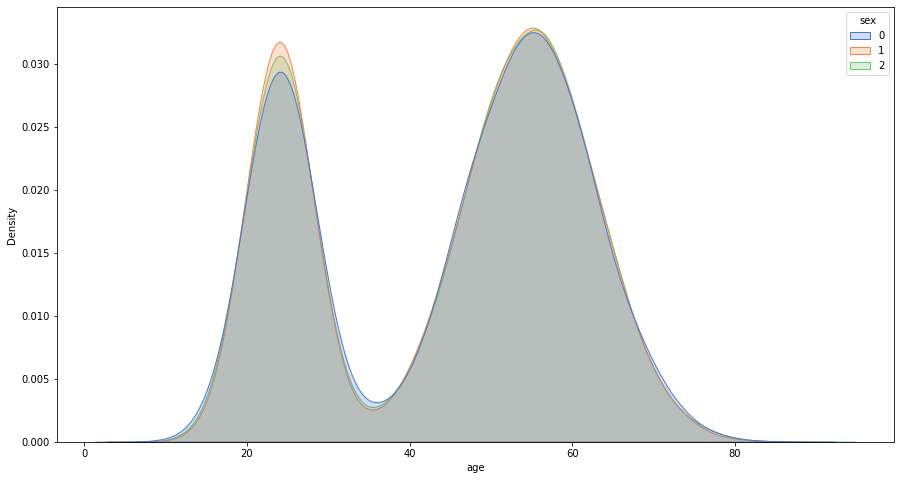

In [ ]:
plt.figure(figsize=(15,8))
sns.kdeplot(data=customers, x='age', hue='sex', fill=True, palette='muted', common_norm=False)
# There is also no significant visual differences between two distribution plots

# Task 4, 5 + EDA

In [ ]:
from fasteda import fast_eda

pd.options.display.float_format = "{:,.2f}".format

In [ ]:
customer_income_view = """
    SELECT customerID, COALESCE(income, 0) as income, sex, residentialAddress, postalAddress, age
    FROM customers
"""

full_set = f""" 
    SELECT transactions_view.*, customers_view.sex, customers_view.age, customers_view.residentialAddress, customers_view.postalAddress FROM
        ({row_number_view}) transactions_view
    LEFT JOIN 
        ({customer_income_view}) customers_view ON transactions_view.customerID=customers_view.customerID

"""

In [ ]:
with sql_pd_conn(viabill_db_path) as conn:
    df = pd.read_sql_query(f"{full_set};", conn)

In [ ]:
df = df[df['customerID'] != '']
df = df.reset_index(drop=True)
df.isna().sum()

transactionID         0
shopID                0
customerID            0
price                 0
paytmentStatus1       0
paytmentStatus2       0
paytmentStatus3       0
paytmentStatus4       0
row_number            0
sex                   0
age                   0
residentialAddress    0
postalAddress         0
dtype: int64

In [ ]:
# df.to_feather('/content/feather_full_data')
# task.upload_artifact(name='viabill_feather', artifact_object='/content/feather_full_data')

viabill_feather_path = task.artifacts['viabill_feather'].get_local_copy()
df = pd.read_feather(viabill_feather_path)

2023-03-26 21:51:14,979 - clearml.storage - INFO - Downloading: 5.00MB / 63.06MB @ 5.37MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_feather/feather_full_data.
2023-03-26 21:51:15,130 - clearml.storage - INFO - Downloading: 10.00MB / 63.06MB @ 33.08MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_feather/feather_full_data.
2023-03-26 21:51:15,278 - clearml.storage - INFO - Downloading: 15.00MB / 63.06MB @ 33.83MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_feather/feather_full_data.
2023-03-26 21:51:15,428 - clearml.storage - INFO - Downloading: 20.00MB / 63.06MB @ 33.46MBs from https://files.clear.ml/Viabill_project/task_1.0117873501b94d7eb241345cea8296db/artifacts/viabill_feather/feather_full_data.
2023-03-26 21:51:15,577 - clearml.storage - INFO - Downloading: 25.00MB / 63.06MB @ 33.37MBs from https://files.cl

In [ ]:
# Add new variable whether customer has different postal and residential address
df.loc[:, 'different_addresses'] = 0 
df.loc[df['residentialAddress'] != df['postalAddress'], 'different_addresses'] = 1
# df = df.drop(columns=['customerID', 'transactionID'])

In [ ]:
# Create auxiliary variables
# We can create variables based on client history
# We havent got exact date so we can just make variables without time factor like paid back loans for last 6months etc.
check_status = 0
df.loc[:, 'paid_weeks_count'] = ((df['paytmentStatus1'] == check_status).astype(int) + (df['paytmentStatus2'] == check_status).astype(int) + 
                              (df['paytmentStatus3'] == check_status).astype(int) + (df['paytmentStatus4'] == check_status).astype(int))

check_status = 1
df.loc[:, 'late_weeks_count'] = ((df['paytmentStatus1'] == check_status).astype(int) + (df['paytmentStatus2'] == check_status).astype(int) + 
                              (df['paytmentStatus3'] == check_status).astype(int) + (df['paytmentStatus4'] == check_status).astype(int))

check_status = 2
df.loc[:, 'failed_weeks_count'] = ((df['paytmentStatus1'] == check_status).astype(int) + (df['paytmentStatus2'] == check_status).astype(int) + 
                                (df['paytmentStatus3'] == check_status).astype(int) + (df['paytmentStatus4'] == check_status).astype(int))


df.loc[:, 'counter'] = 1

# row number "1" is the most recent
# Sort for creating history variables
df = df.sort_values(by=['customerID', 'row_number'], ascending=[True, False])

# Create information about client paying back history
result = df[['customerID', 'paid_weeks_count', 'late_weeks_count', 'failed_weeks_count', 'counter']].groupby(['customerID']).expanding().sum().groupby(['customerID']).shift(1)
result.index = result.index.get_level_values(1)
result.columns = ['paid_weeks_history', 'late_weeks_history', 'failed_weeks_history', 'previous_loans_count']
df = df.merge(result, left_index=True, right_index=True, how='inner')

# Create information about client mean price_actions
result = df[['customerID', 'price']].groupby(['customerID']).expanding().mean().groupby(['customerID']).shift(1)
result.index = result.index.get_level_values(1)
result.columns = ['previous_mean_loans']
df = df.merge(result, left_index=True, right_index=True, how='inner')

# Get information whether client has some credit history
df.loc[:, 'has_history'] = 1
df.loc[df['paid_weeks_history'].isna(), 'has_history'] = 0

# Fillna after previous groupby with shift for history variables
df = df.fillna(0)

# Get train/test test as most recent transction of given client
df.loc[:, 'is_train'] = 1
df.loc[df['row_number'] == 1, 'is_train'] = 0


# Above methods can be parallelized with multiprocessing library or just run by Polars for acceleration.
# There is no need, we can process the data in time below one minute

In [ ]:
# We could create a lot more vairables like:
# * How often loan was paid back from different shop
# * What is usually the price of well paid loans  
# * How many previous full loans (not weeks) were fully paid
# * What is the region of residential and postal address, maybe what is the mean ratio paid/not_paid in given region,  
# * Did Client recently change address 
# * What is the time difference between last and current transaction (in this case difference between id's) 

# For simplicity it should be enough for the presentation case 

In [ ]:
# Create target
# 1 - client pay back full loan
# 0 - client did not paid back full loan

df.loc[:, 'target'] = 1  # Client pay back the loan
df.loc[(df['paytmentStatus1'] == 2) | (df['paytmentStatus2'] == 2) | (df['paytmentStatus3'] == 2) | (df['paytmentStatus4'] == 2) ,'target'] = 0  # Client do not pay back the loan
df['target'].value_counts()

1    1797760
0     182223
Name: target, dtype: int64

In [ ]:
df.describe(percentiles=[.25, .5, .75, .85, .9, .95, .98, .99])

,transactionID,shopID,customerID,price,paytmentStatus1,paytmentStatus2,paytmentStatus3,paytmentStatus4,row_number,sex,age,different_addresses,paid_weeks_count,late_weeks_count,failed_weeks_count,counter,paid_weeks_history,late_weeks_history,failed_weeks_history,previous_loans_count,previous_mean_loans,has_history,is_train,target
count,"1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00","1,979,983.00"
mean,"1,000,053.82",549.23,"250,095.15",101.52,0.12,0.15,0.19,0.27,2.98,1.15,44.63,0.07,3.46,0.35,0.18,1.00,6.85,0.70,0.37,1.98,76.34,0.75,0.75,0.91
std,"577,333.56",259.86,"144,288.94",57.18,0.36,0.43,0.51,0.62,1.81,0.48,16.18,0.25,0.85,0.60,0.67,0.00,6.41,1.17,1.12,1.81,57.13,0.43,0.43,0.29
min,1.00,100.00,1.00,3.00,0.00,0.00,0.00,0.00,1.00,0.00,5.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,"500,072.50",324.00,"125,139.00",52.00,0.00,0.00,0.00,0.00,2.00,1.00,27.00,0.00,3.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,4.00,1.00,1.00,1.00
50%,"1,000,018.00",549.00,"250,096.00",102.00,0.00,0.00,0.00,0.00,3.00,1.00,50.00,0.00,4.00,0.00,0.00,1.00,5.00,0.00,0.00,2.00,84.00,1.00,1.00,1.00
75%,"1,500,016.50",774.00,"375,093.00",151.00,0.00,0.00,0.00,0.00,4.00,1.00,58.00,0.00,4.00,1.00,0.00,1.00,11.00,1.00,0.00,3.00,119.00,1.00,1.00,1.00
85%,"1,700,045.70",864.00,"424,945.70",171.00,0.00,0.00,0.00,1.00,5.00,2.00,61.00,0.00,4.00,1.00,0.00,1.00,14.00,2.00,0.00,4.00,137.00,1.00,1.00,1.00
90%,"1,800,044.80",909.00,"449,960.80",181.00,1.00,1.00,1.00,1.00,5.00,2.00,63.00,0.00,4.00,1.00,0.00,1.00,16.00,2.00,1.00,4.00,150.00,1.00,1.00,1.00
95%,"1,900,016.90",954.00,"474,987.00",191.00,1.00,1.00,2.00,2.00,6.00,2.00,66.00,1.00,4.00,2.00,2.00,1.00,19.00,3.00,3.00,5.00,169.00,1.00,1.00,1.00


DataFrame Head:


,transactionID,shopID,customerID,price,paytmentStatus1,paytmentStatus2,paytmentStatus3,paytmentStatus4,row_number,sex,age,residentialAddress,postalAddress,different_addresses,paid_weeks_count,late_weeks_count,failed_weeks_count,counter,paid_weeks_history,late_weeks_history,failed_weeks_history,previous_loans_count,has_history,is_train,previous_mean_loans,target
3,119294,634,1,88,0,0,0,0,4,1.00,25.00,28 Irvine Place,28 Irvine Place,0,4,0,0,1,0.00,0.00,0.00,0.00,0,1,0.00,1
2,832074,942,1,177,1,0,0,0,3,1.00,25.00,28 Irvine Place,28 Irvine Place,0,3,1,0,1,4.00,0.00,0.00,1.00,1,1,88.00,1
1,868540,361,1,93,0,0,0,0,2,1.00,25.00,28 Irvine Place,28 Irvine Place,0,4,0,0,1,7.00,1.00,0.00,2.00,1,1,132.50,1


DataFrame Tail:


,transactionID,shopID,customerID,price,paytmentStatus1,paytmentStatus2,paytmentStatus3,paytmentStatus4,row_number,sex,age,residentialAddress,postalAddress,different_addresses,paid_weeks_count,late_weeks_count,failed_weeks_count,counter,paid_weeks_history,late_weeks_history,failed_weeks_history,previous_loans_count,has_history,is_train,previous_mean_loans,target
1979975,1722718,726,499999,171,0,0,0,0,1,1.00,55.00,34 Kiandra Close,34 Kiandra Close,0,4,0,0,1,20.00,0.00,0.00,5.00,1,0,132.80,1
1979982,1025647,270,500000,20,0,0,0,0,2,2.00,42.00,46 Altola Street,46 Altola Street,0,4,0,0,1,0.00,0.00,0.00,0.00,0,1,0.00,1
1979981,1591096,954,500000,124,0,0,0,0,1,2.00,42.00,46 Altola Street,46 Altola Street,0,4,0,0,1,4.00,0.00,0.00,1.00,1,0,20.00,1


----------------------------------------------------------------------------------------------------
Missing values:


,0


----------------------------------------------------------------------------------------------------
Shape of DataFrame:

(1979983, 26)

----------------------------------------------------------------------------------------------------
DataFrame Info:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1979983 entries, 3 to 1979981
Data columns (total 26 columns):
 #   Column                Dtype  
---  ------                -----  
 0   transactionID         int64  
 1   shopID                int64  
 2   customerID            int64  
 3   price                 int64  
 4   paytmentStatus1       int64  
 5   paytmentStatus2       int64  
 6   paytmentStatus3       int64  
 7   paytmentStatus4       int64  
 8   row_number            int64  
 9   sex                   float64
 10  age                   float64
 11  residentialAddress    object 
 12  postalAddress         object 
 13  different_addresses   int64  
 14  paid_weeks_count      int64  
 15  late_weeks_count      int64  
 1

/usr/local/lib/python3.9/dist-packages/fasteda/__init__.py:76: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

/usr/local/lib/python3.9/dist-packages/fasteda/__init__.py:77: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



,count,mean,median,std,min,25%,50%,75%,max,skewness,kurtosis
transactionID,1979983,1000053.823,1000018,577333.564,1,500072.5,1000018,1500016.5,2000000,-0.000052,-1.199918
shopID,1979983,549.229,549,259.855,100,324,549,774,999,0.001202,-1.200244
customerID,1979983,250095.15,250096,144288.945,1,125139,250096,375093,500000,-0.000973,-1.199448
price,1979983,101.521,102,57.178,3,52,102,151,200,-0.001085,-1.200817
paytmentStatus1,1979983,0.118,0,0.361,0,0,0,0,2,3.177626,10.052536
paytmentStatus2,1979983,0.147,0,0.428,0,0,0,0,2,3.006027,8.520109
paytmentStatus3,1979983,0.19,0,0.505,0,0,0,0,2,2.655120,5.973930
paytmentStatus4,1979983,0.269,0,0.617,0,0,0,0,2,2.108408,2.910259
row_number,1979983,2.978,3,1.811,1,2,3,4,16,0.988631,0.834420
sex,1979983,1.15,1,0.478,0,1,1,1,2,0.399302,0.698253


----------------------------------------------------------------------------------------------------
DataFrame Correlation:



/usr/local/lib/python3.9/dist-packages/fasteda/__init__.py:133: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



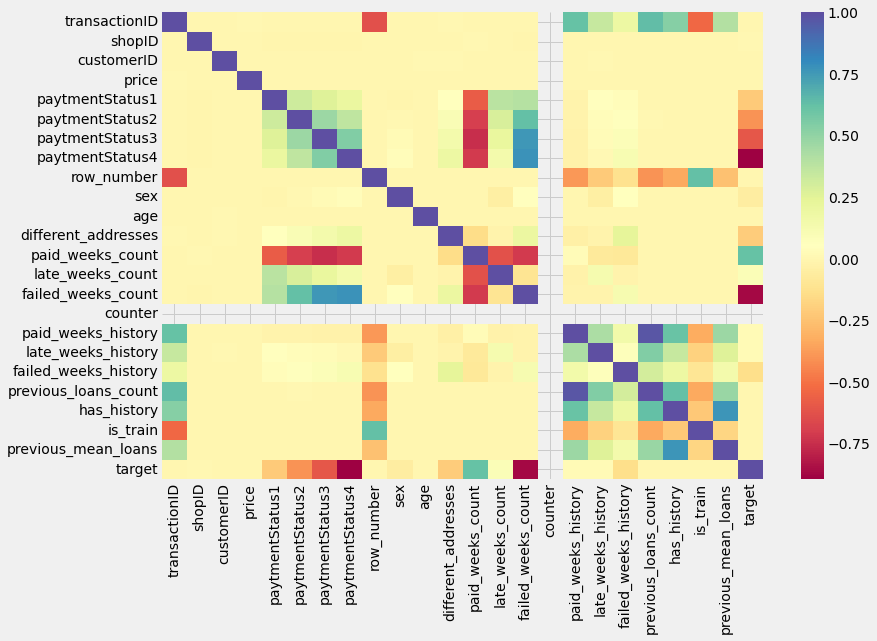

----------------------------------------------------------------------------------------------------
Histogram(s) & Boxplot(s):



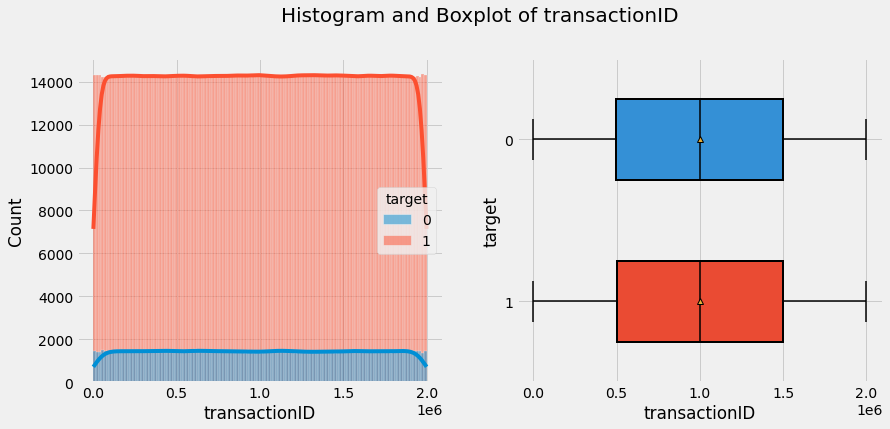

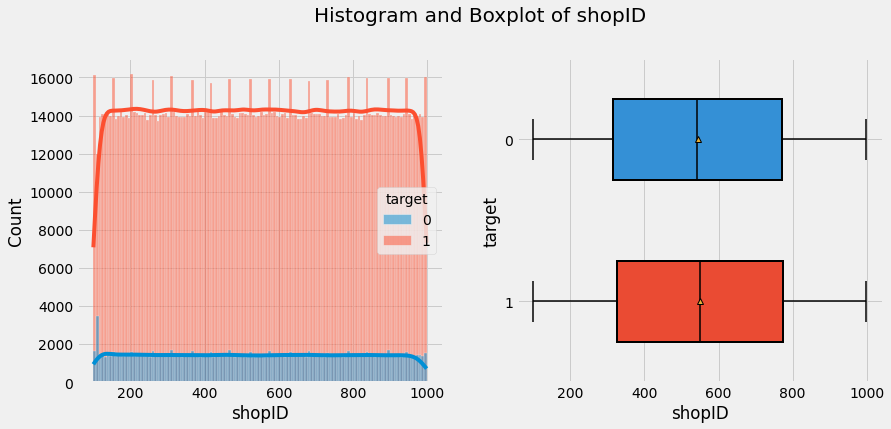

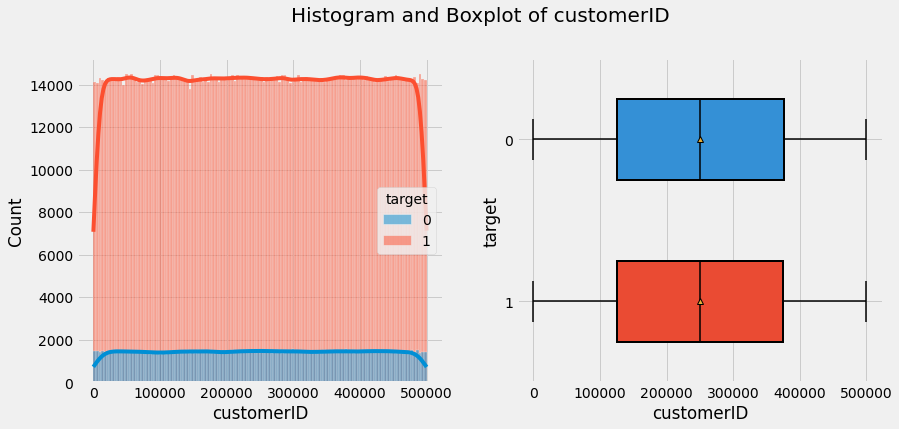

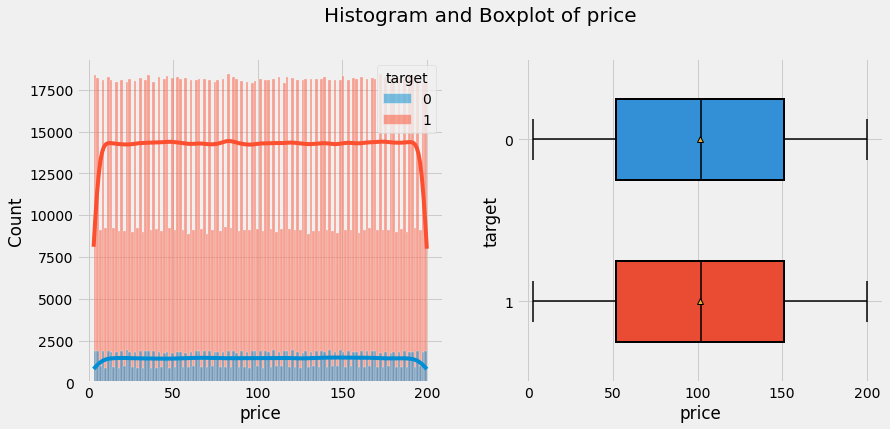

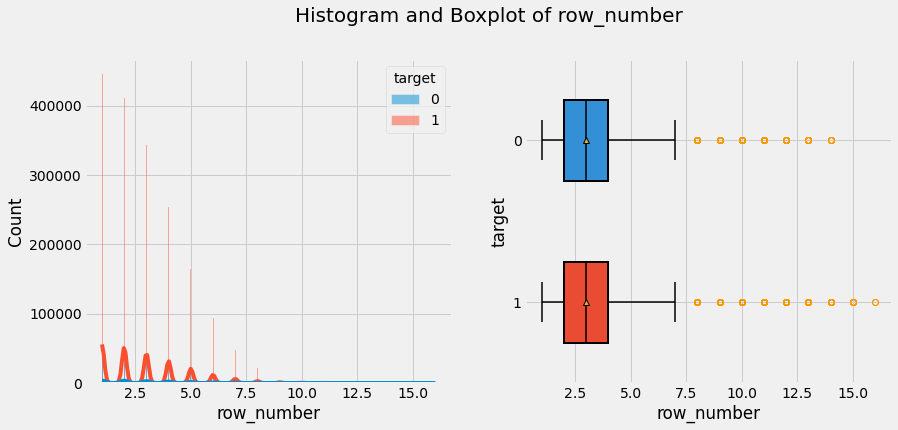

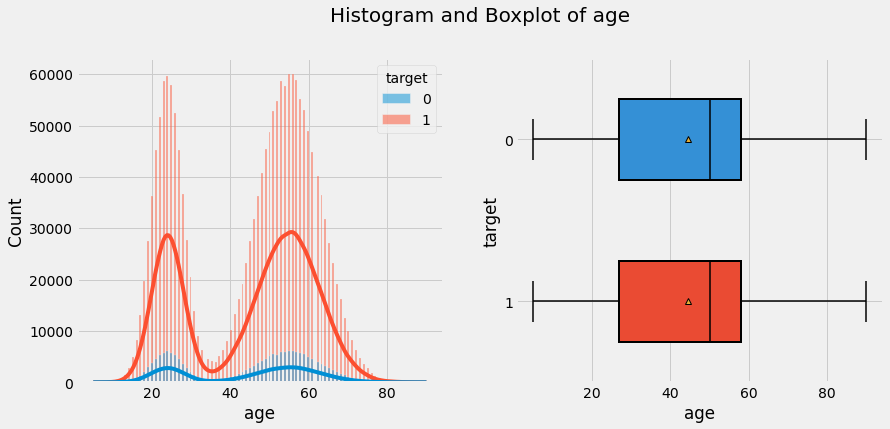

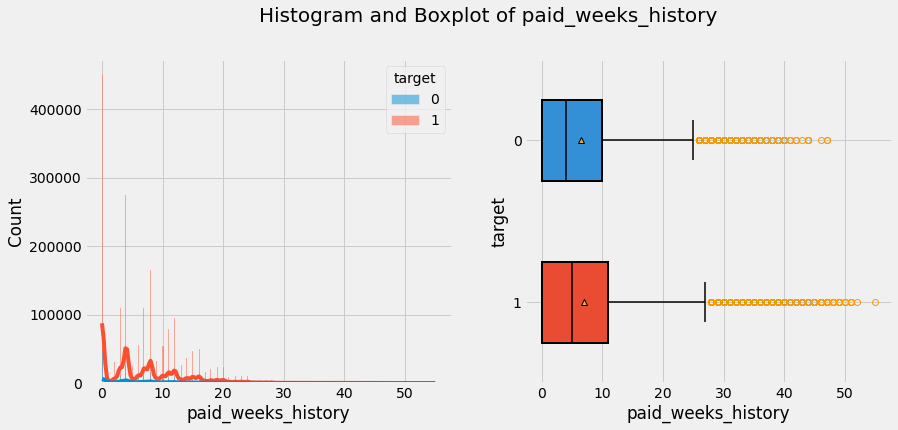

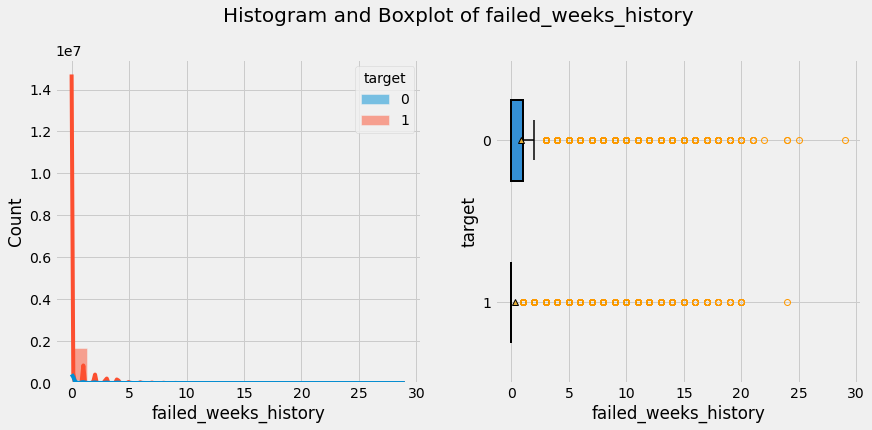

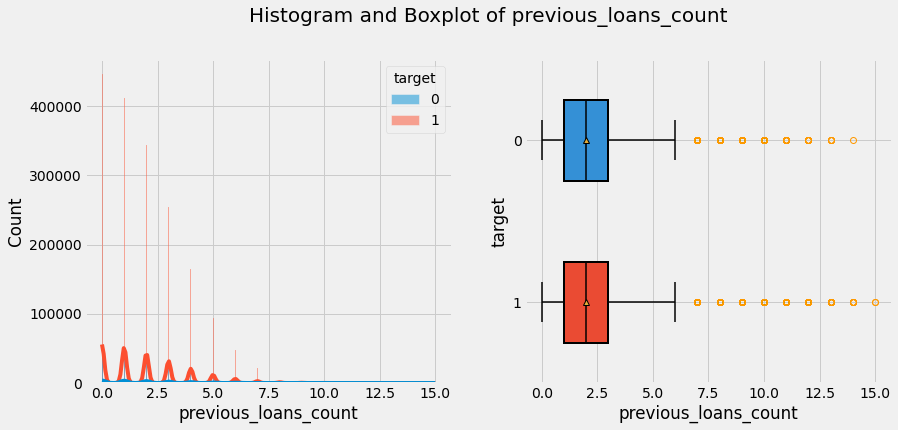

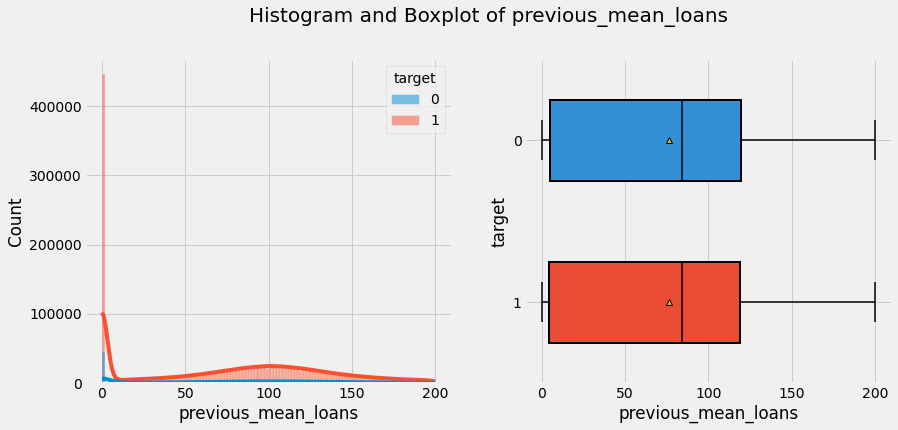

----------------------------------------------------------------------------------------------------
Countplot(s):



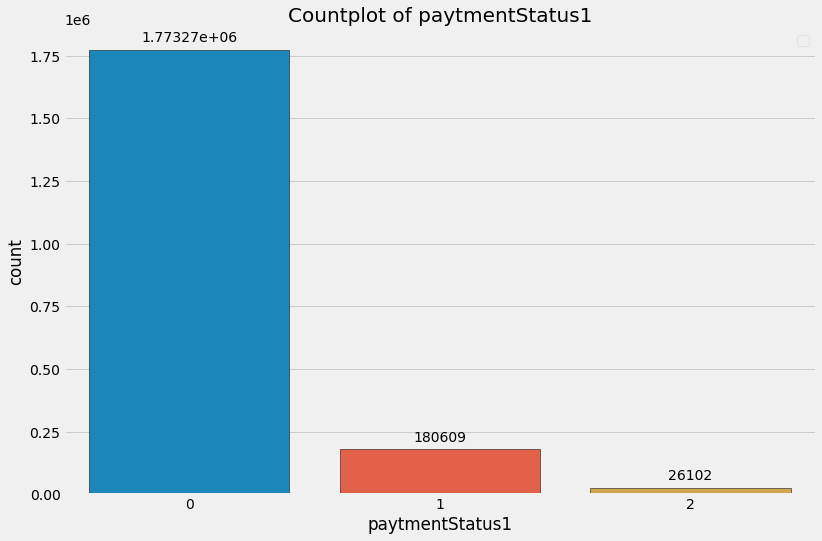

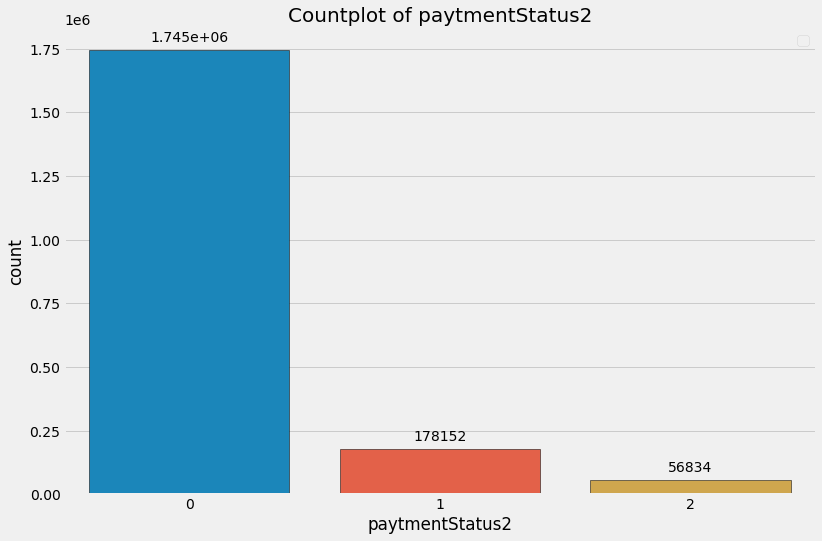

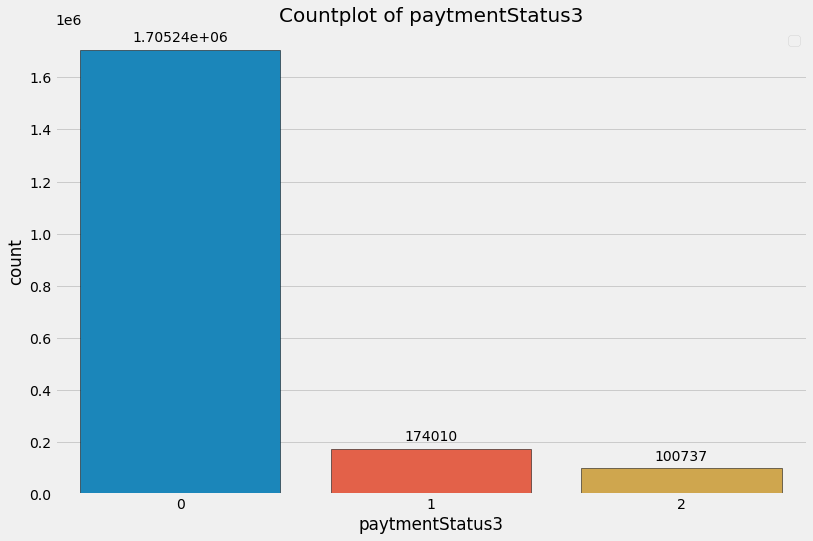

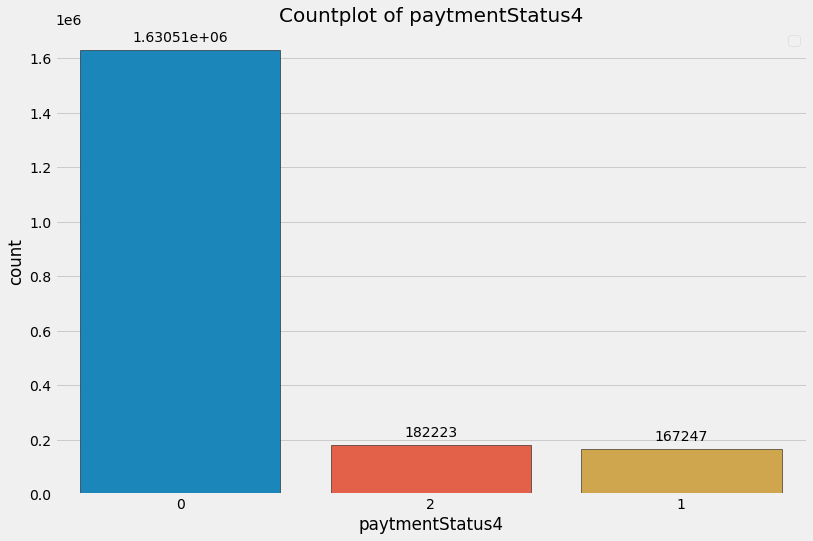

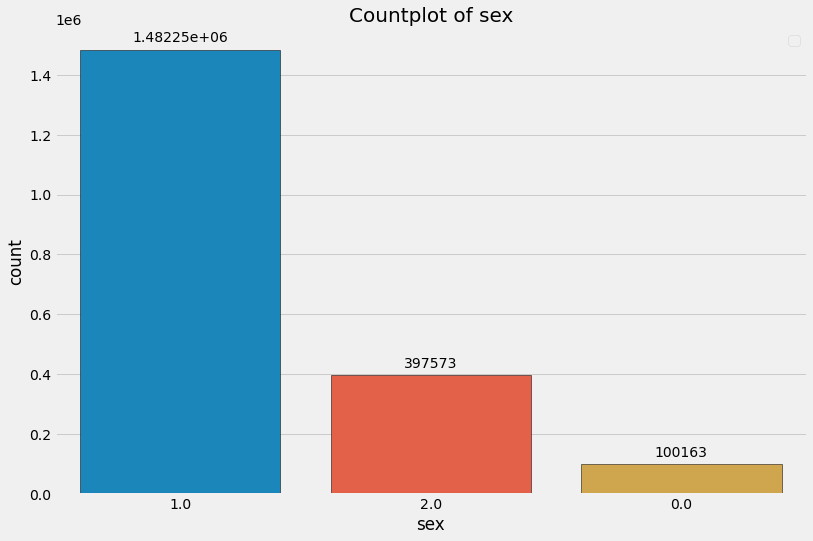

...

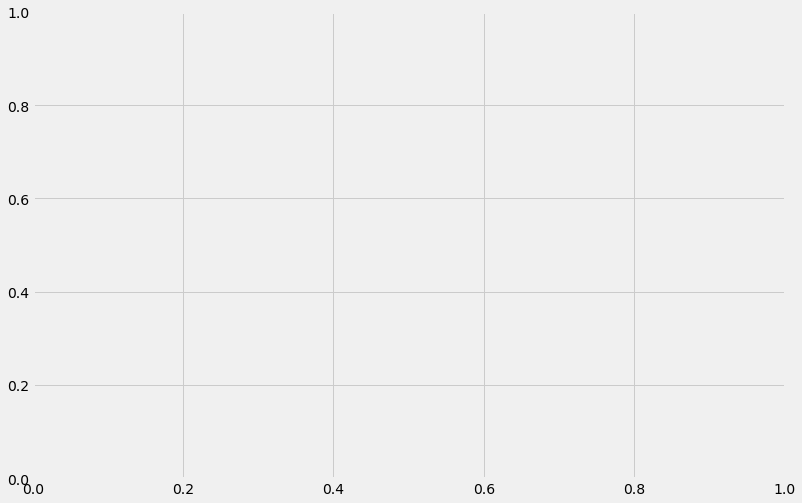

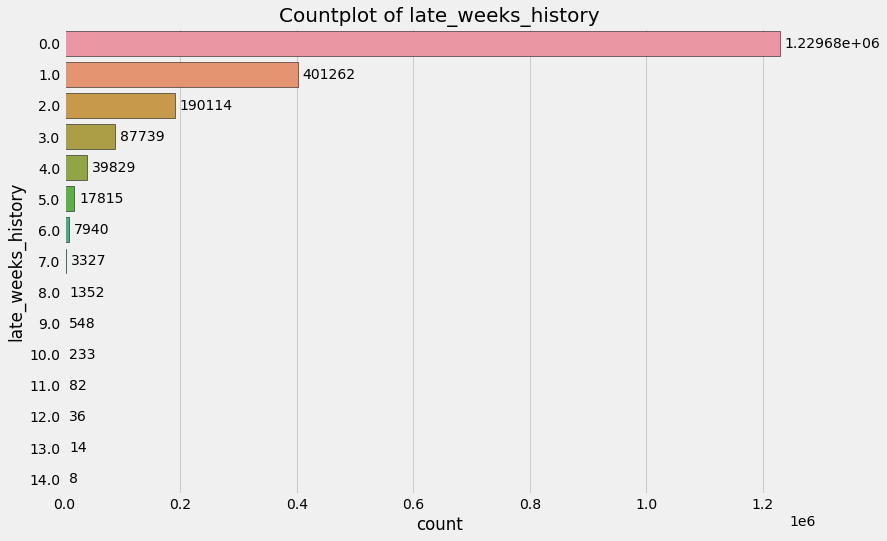

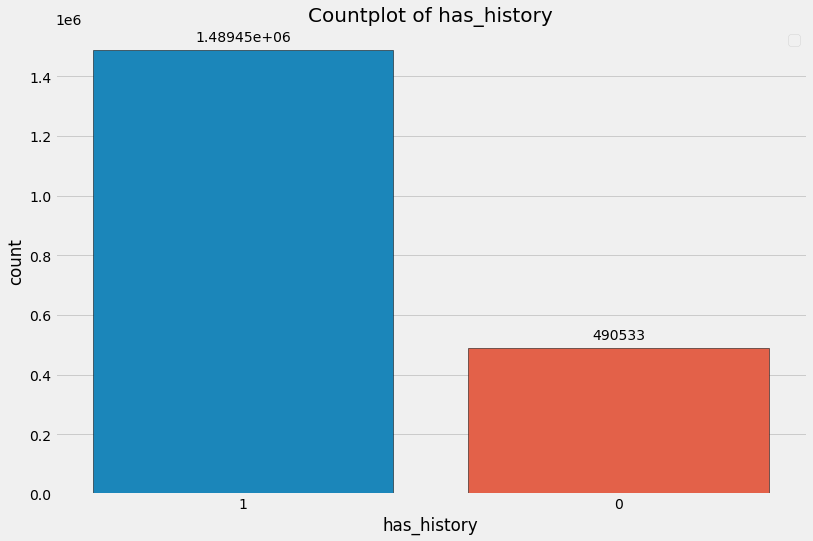

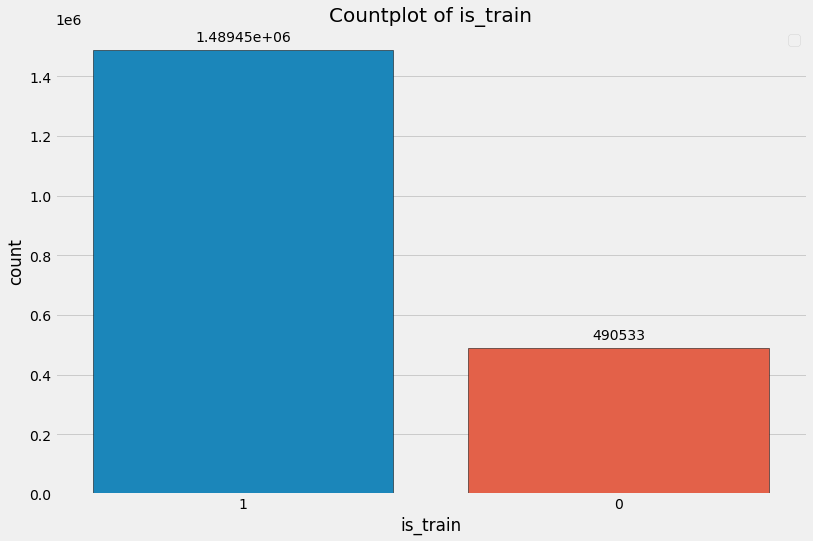

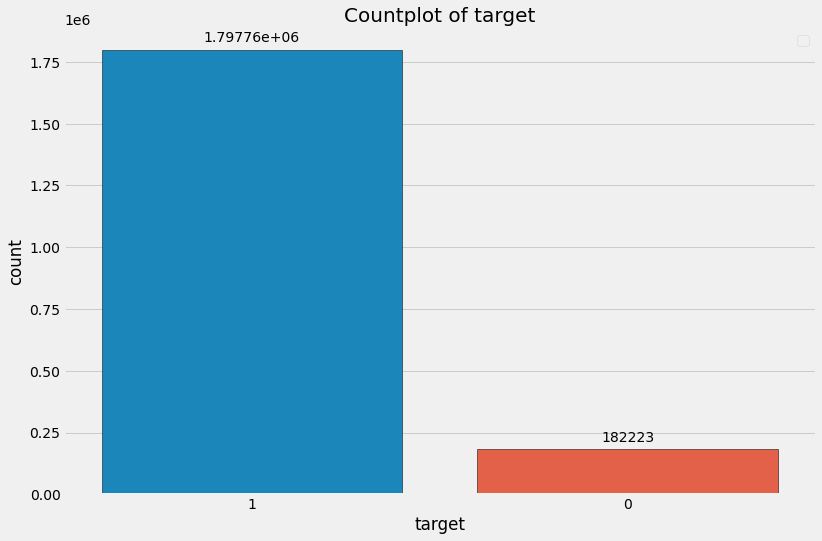

In [ ]:
## EDA for all variables
fast_eda(df, target='target', pairplot=False)

In [ ]:
df.corrwith(df['target'])

<ipython-input-39-c15f237ddc7b>:1: FutureWarning:

The default value of numeric_only in DataFrame.corrwith is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



transactionID           0.00
shopID                  0.01
customerID             -0.00
price                  -0.00
paytmentStatus1        -0.22
paytmentStatus2        -0.40
paytmentStatus3        -0.60
paytmentStatus4        -0.89
row_number             -0.00
sex                    -0.05
age                     0.00
different_addresses    -0.21
paid_weeks_count        0.62
late_weeks_count        0.09
failed_weeks_count     -0.87
counter                  NaN
paid_weeks_history      0.02
late_weeks_history      0.02
failed_weeks_history   -0.14
previous_loans_count   -0.00
has_history            -0.00
is_train               -0.00
previous_mean_loans    -0.00
target                  1.00
dtype: float64

In [ ]:
df.corrwith(df['target'], method='kendall')

<ipython-input-48-816262e2bf94>:1: FutureWarning:

The default value of numeric_only in DataFrame.corrwith is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

/usr/local/lib/python3.9/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning:

overflow encountered in long_scalars



transactionID           0.00
shopID                  0.01
customerID             -0.00
price                  -0.00
paytmentStatus1        -0.13
paytmentStatus2        -0.27
paytmentStatus3        -0.45
paytmentStatus4        -0.74
row_number             -0.00
sex                    -0.06
age                     0.00
different_addresses    -0.21
paid_weeks_count        0.48
late_weeks_count        0.09
failed_weeks_count     -0.98
counter                  NaN
paid_weeks_history      0.02
late_weeks_history      0.02
failed_weeks_history   -0.11
previous_loans_count   -0.00
has_history            -0.00
is_train               -0.00
previous_mean_loans    -0.00
target                  1.00
dtype: float64

In [ ]:
df.corrwith(df['target'], method='spearman')

<ipython-input-49-e9a21114230b>:1: FutureWarning:

The default value of numeric_only in DataFrame.corrwith is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

/usr/local/lib/python3.9/dist-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



transactionID           0.00
shopID                  0.01
customerID             -0.00
price                  -0.00
paytmentStatus1        -0.13
paytmentStatus2        -0.28
paytmentStatus3        -0.46
paytmentStatus4        -0.75
row_number             -0.00
sex                    -0.06
age                     0.00
different_addresses    -0.21
paid_weeks_count        0.50
late_weeks_count        0.10
failed_weeks_count     -1.00
counter                  NaN
paid_weeks_history      0.02
late_weeks_history      0.02
failed_weeks_history   -0.11
previous_loans_count   -0.00
has_history            -0.00
is_train               -0.00
previous_mean_loans    -0.00
target                  1.00
dtype: float64

In [ ]:
#TODO: What if Client once is late with their loan? If the next installments will be paid on time or not?
#TODO: If installment is not paid at all, next installments will be paid or not?

In [ ]:
# This could be done better but just for fast checker
# We can also just check correlation heatmap

print(df[(df['paytmentStatus1'] == 1) & (df['paytmentStatus2'] == 1)].shape[0])
print(df[(df['paytmentStatus1'] == 1) & (df['paytmentStatus3'] == 1)].shape[0])
print(df[(df['paytmentStatus1'] == 1) & (df['paytmentStatus4'] == 1)].shape[0])

print(df[(df['paytmentStatus1'] == 0) & (df['paytmentStatus2'] == 1)].shape[0])
print(df[(df['paytmentStatus1'] == 0) & (df['paytmentStatus3'] == 1)].shape[0])
print(df[(df['paytmentStatus1'] == 0) & (df['paytmentStatus4'] == 1)].shape[0])

22298
22055
21024
155854
151955
146223


In [ ]:
df

,transactionID,shopID,customerID,price,paytmentStatus1,paytmentStatus2,paytmentStatus3,paytmentStatus4,row_number,sex,age,residentialAddress,postalAddress,different_addresses,paid_weeks_count,late_weeks_count,failed_weeks_count,counter,paid_weeks_history,late_weeks_history,failed_weeks_history,previous_loans_count,previous_mean_loans,has_history,is_train,target,late_1_pay,late_2_pay,late_3_pay,late_4_pay
3,119294,634,1,88,0,0,0,0,4,1.00,25.00,28 Irvine Place,28 Irvine Place,0,4,0,0,1,0.00,0.00,0.00,0.00,0.00,0,1,1,0,0,0,0
2,832074,942,1,177,1,0,0,0,3,1.00,25.00,28 Irvine Place,28 Irvine Place,0,3,1,0,1,4.00,0.00,0.00,1.00,88.00,1,1,1,0,0,0,0
1,868540,361,1,93,0,0,0,0,2,1.00,25.00,28 Irvine Place,28 Irvine Place,0,4,0,0,1,7.00,1.00,0.00,2.00,132.50,1,1,1,0,0,0,0
0,1697842,248,1,147,0,0,0,0,1,1.00,25.00,28 Irvine Place,28 Irvine Place,0,4,0,0,1,11.00,1.00,0.00,3.00,119.33,1,0,1,0,0,0,0
10,983409,741,2,71,1,0,0,0,7,1.00,19.00,72 Bertha Street,72 Bertha Street,0,3,1,0,1,0.00,0.00,0.00,0.00,0.00,0,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1979977,1557992,779,499999,142,0,0,0,0,3,1.00,55.00,34 Kiandra Close,34 Kiandra Close,0,4,0,0,1,12.00,0.00,0.00,3.00,127.00,1,1,1,0,0,0,0
1979976,1700131,193,499999,141,0,0,0,0,2,1.00,55.00,34 Kiandra Close,34 Kiandra Close,0,4,0,0,1,16.00,0.00,0.00,4.00,130.75,1,1,1,0,0,0,0
1979975,1722718,726,499999,171,0,0,0,0,1,1.00,55.00,34 Kiandra Close,34 Kiandra Close,0,4,0,0,1,20.00,0.00,0.00,5.00,132.80,1,0,1,0,0,0,0
1979982,1025647,270,500000,20,0,0,0,0,2,2.00,42.00,46 Altola Street,46 Altola Street,0,4,0,0,1,0.00,0.00,0.00,0.00,0.00,0,1,1,0,0,0,0


In [ ]:
# Fast create some new cols
df.loc[:, ['late_1_pay', 'late_2_pay', 'late_3_pay', 'late_4_pay']] = 0
df.loc[df['paytmentStatus1'] == 1, 'late_1_pay'] = 1
df.loc[df['paytmentStatus2'] == 1, 'late_2_pay'] = 1
df.loc[df['paytmentStatus3'] == 1, 'late_3_pay'] = 1
df.loc[df['paytmentStatus4'] == 1, 'late_4_pay'] = 1

# There is no significant relation
df[['late_1_pay', 'late_2_pay', 'late_3_pay', 'late_4_pay']].corr()

,late_1_pay,late_2_pay,late_3_pay,late_4_pay
late_1_pay,1.00,0.04,0.04,0.04
late_2_pay,0.04,1.00,0.04,0.04
late_3_pay,0.04,0.04,1.00,0.04
late_4_pay,0.04,0.04,0.04,1.00


In [ ]:
# Everything is ok
print(df[(df['paytmentStatus1'] == 2) & (df['paytmentStatus2'] == 2)].shape[0])
print(df[(df['paytmentStatus1'] == 2) & (df['paytmentStatus3'] == 2)].shape[0])
print(df[(df['paytmentStatus1'] == 2) & (df['paytmentStatus4'] == 2)].shape[0])

print(df[(df['paytmentStatus2'] == 2) & (df['paytmentStatus3'] == 2)].shape[0])
print(df[(df['paytmentStatus2'] == 2) & (df['paytmentStatus4'] == 2)].shape[0])

print(df[(df['paytmentStatus3'] == 2) & (df['paytmentStatus4'] == 2)].shape[0])


print(df[(df['paytmentStatus1'] == 2) & (df['paytmentStatus2'] != 2)].shape[0])
print(df[(df['paytmentStatus1'] == 2) & (df['paytmentStatus3'] != 2)].shape[0])
print(df[(df['paytmentStatus1'] == 2) & (df['paytmentStatus4'] != 2)].shape[0])

print(df[(df['paytmentStatus2'] == 2) & (df['paytmentStatus3'] != 2)].shape[0])
print(df[(df['paytmentStatus2'] == 2) & (df['paytmentStatus4'] != 2)].shape[0])

print(df[(df['paytmentStatus3'] == 2) & (df['paytmentStatus4'] != 2)].shape[0])

26102
26102
26102
56834
56834
100737
0
0
0
0
0
0


In [ ]:
# Fast create some new cols
df.loc[:, ['no_pay_1', 'no_pay_2', 'no_pay_3', 'no_pay_4']] = 0
df.loc[df['paytmentStatus1'] == 2, 'no_pay_1'] = 1
df.loc[df['paytmentStatus2'] == 2, 'no_pay_2'] = 1
df.loc[df['paytmentStatus3'] == 2, 'no_pay_3'] = 1
df.loc[df['paytmentStatus4'] == 2, 'no_pay_4'] = 1

df[['no_pay_1', 'no_pay_2', 'no_pay_3', 'no_pay_4']].corr()

<ipython-input-23-93274c07c82d>:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:, ['no_pay_1', 'no_pay_2', 'no_pay_3', 'no_pay_4']] = 0


,no_pay_1,no_pay_2,no_pay_3,no_pay_4
no_pay_1,1.00,0.67,0.50,0.36
no_pay_2,0.67,1.00,0.74,0.54
no_pay_3,0.50,0.74,1.00,0.73
no_pay_4,0.36,0.54,0.73,1.00


## A little bit of summary
<ul>
    <li> A lot of variables are just randomly sampled from normal-like dirstibutions: same distribution mean that there will be no difference between  well paying clients and thiefs [very bad predictiors in modelling phase]</li>
    <li> People tend to fail with their payment 3,4 weeks much more then 1,2. <b>The later in time after taking a loan the bigger probability for client not paying the installment.</b> </li>
    <li> Distributions of client being late with paying the loan are the same across all of the weeks. </li>
    <li> Different addresses variable is a nice catch maybe related to potential fraud. Significant relation with target variable </li>
    <li> There is small correlation between target and variables: sex, failed_weeks_history, different_address </li>
    <li> paid_weeks_history, failed_weeks_history can be significant features in modeeling as well, but not as the others</li>
</ul>

# Task 6

Short assumptions about modelling
<ul>
    <li>We try to get clients with very high chance to pay debt and also this peoplo who won't pay a loan (two points of threshold), We shouldnt give loan to high risk client, We can send some promotions to people from best basket</li>
    <li>What is the best trade off between chance of paying full loan, vs probability of failure?</li>
</ul>

In [ ]:
df.columns

Index(['transactionID', 'shopID', 'customerID', 'price', 'paytmentStatus1',
       'paytmentStatus2', 'paytmentStatus3', 'paytmentStatus4', 'row_number',
       'sex', 'age', 'residentialAddress', 'postalAddress',
       'different_addresses', 'paid_weeks_count', 'late_weeks_count',
       'failed_weeks_count', 'counter', 'paid_weeks_history',
       'late_weeks_history', 'failed_weeks_history', 'previous_loans_count',
       'previous_mean_loans', 'has_history', 'is_train', 'target',
       'late_1_pay', 'late_2_pay', 'late_3_pay', 'late_4_pay', 'no_pay_1',
       'no_pay_2', 'no_pay_3', 'no_pay_4'],
      dtype='object')

In [ ]:
possible_modelling_cols = ['price', 'row_number',
       'sex', 'age', 'different_addresses', 'paid_weeks_history',
       'late_weeks_history', 'failed_weeks_history', 'previous_loans_count',
       'has_history', 'previous_mean_loans', 'target']

DataFrame Head:


,price,row_number,sex,age,different_addresses,paid_weeks_history,late_weeks_history,failed_weeks_history,previous_loans_count,has_history,previous_mean_loans,target
3,88,4,1.00,25.00,0,0.00,0.00,0.00,0.00,0,0.00,1
2,177,3,1.00,25.00,0,4.00,0.00,0.00,1.00,1,88.00,1
1,93,2,1.00,25.00,0,7.00,1.00,0.00,2.00,1,132.50,1


DataFrame Tail:


,price,row_number,sex,age,different_addresses,paid_weeks_history,late_weeks_history,failed_weeks_history,previous_loans_count,has_history,previous_mean_loans,target
1979975,171,1,1.00,55.00,0,20.00,0.00,0.00,5.00,1,132.80,1
1979982,20,2,2.00,42.00,0,0.00,0.00,0.00,0.00,0,0.00,1
1979981,124,1,2.00,42.00,0,4.00,0.00,0.00,1.00,1,20.00,1


----------------------------------------------------------------------------------------------------
Missing values:


,0


----------------------------------------------------------------------------------------------------
Shape of DataFrame:

(1979983, 12)

----------------------------------------------------------------------------------------------------
DataFrame Info:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1979983 entries, 3 to 1979981
Data columns (total 12 columns):
 #   Column                Dtype  
---  ------                -----  
 0   price                 int64  
 1   row_number            int64  
 2   sex                   float64
 3   age                   float64
 4   different_addresses   int64  
 5   paid_weeks_history    float64
 6   late_weeks_history    float64
 7   failed_weeks_history  float64
 8   previous_loans_count  float64
 9   has_history           int64  
 10  previous_mean_loans   float64
 11  target                int64  
dtypes: float64(7), int64(5)
memory usage: 260.9 MB
------------------------------------------------------------------------------------------

,count,mean,median,std,min,25%,50%,75%,max,skewness,kurtosis
price,1979983,101.521,102,57.178,3,52,102,151,200,-0.001085,-1.200817
row_number,1979983,2.978,3,1.811,1,2,3,4,16,0.988631,0.834420
sex,1979983,1.15,1,0.478,0,1,1,1,2,0.399302,0.698253
age,1979983,44.631,50,16.175,5,27,50,58,90,-0.284824,-1.278908
different_addresses,1979983,0.069,0,0.254,0,0,0,0,1,3.392130,9.506548
paid_weeks_history,1979983,6.848,5,6.414,0,0,5,11,55,1.049491,1.039000
late_weeks_history,1979983,0.699,0,1.165,0,0,0,1,14,2.284195,6.833425
failed_weeks_history,1979983,0.366,0,1.115,0,0,0,0,29,4.448435,28.655325
previous_loans_count,1979983,1.978,2,1.811,0,1,2,3,15,0.988631,0.834420
has_history,1979983,0.752,1,0.432,0,1,1,1,1,-1.168644,-0.634271


----------------------------------------------------------------------------------------------------
DataFrame Correlation:



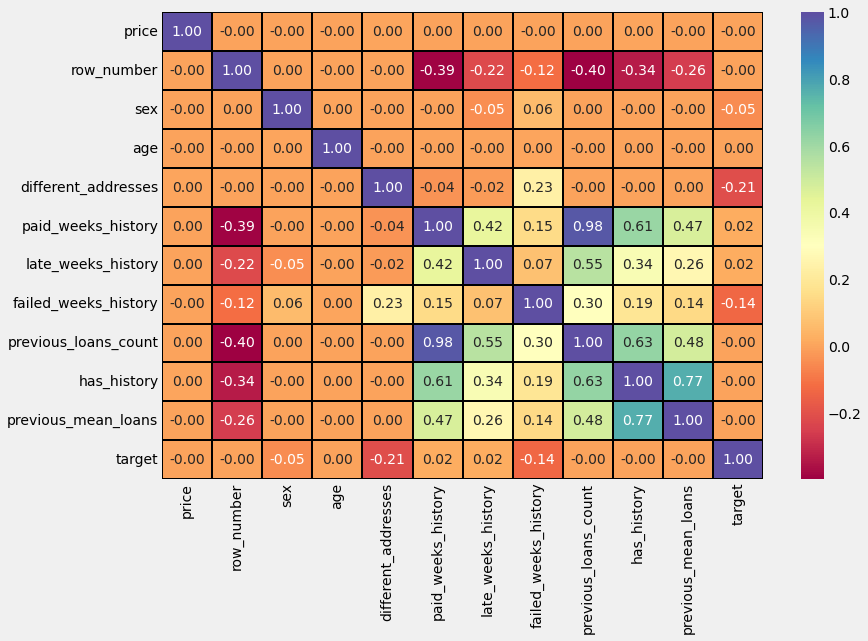

----------------------------------------------------------------------------------------------------
Histogram(s) & Boxplot(s):



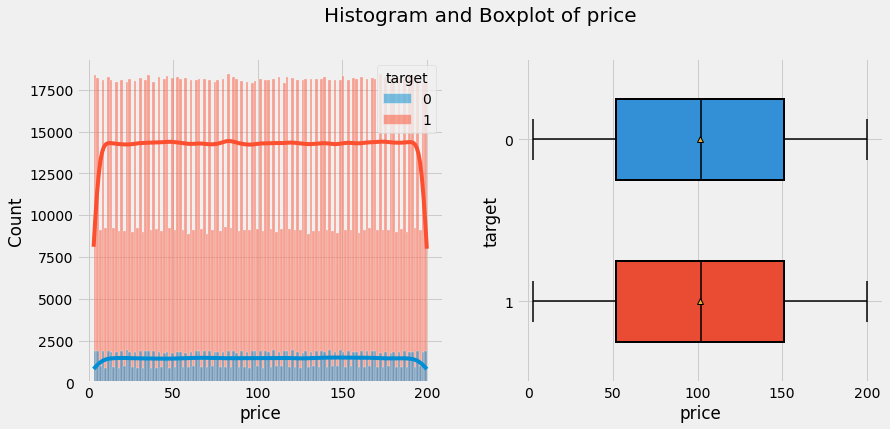

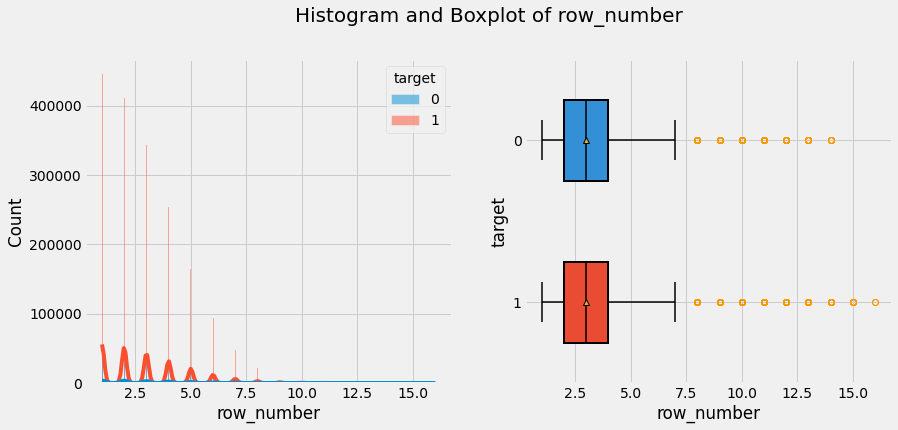

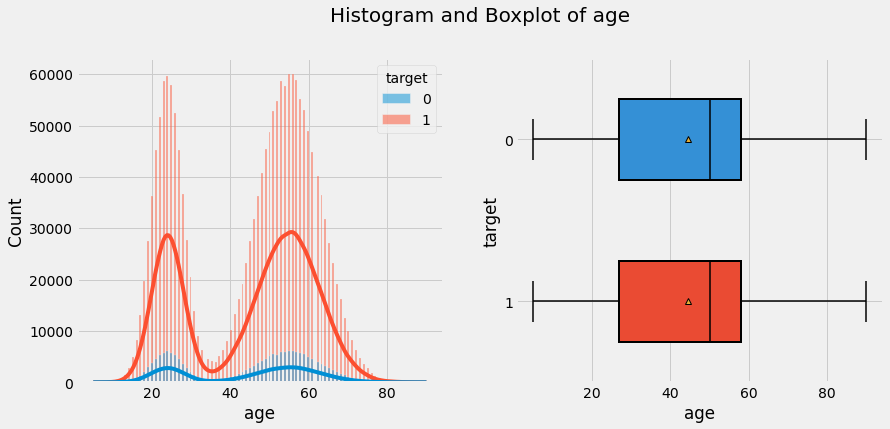

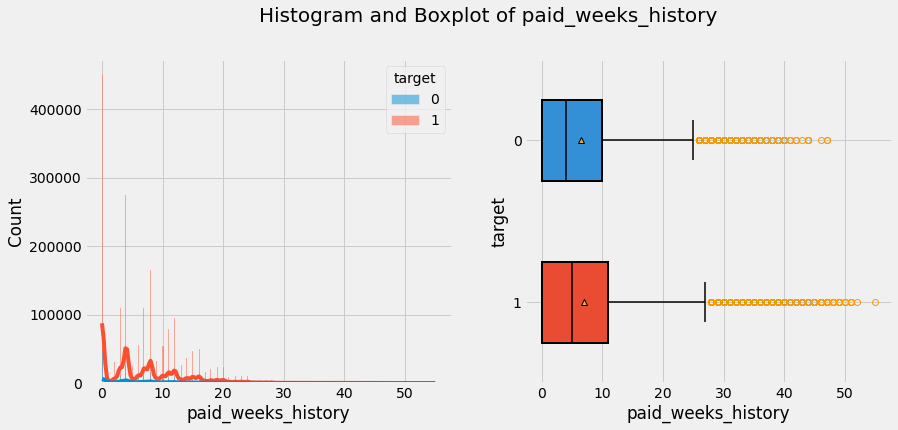

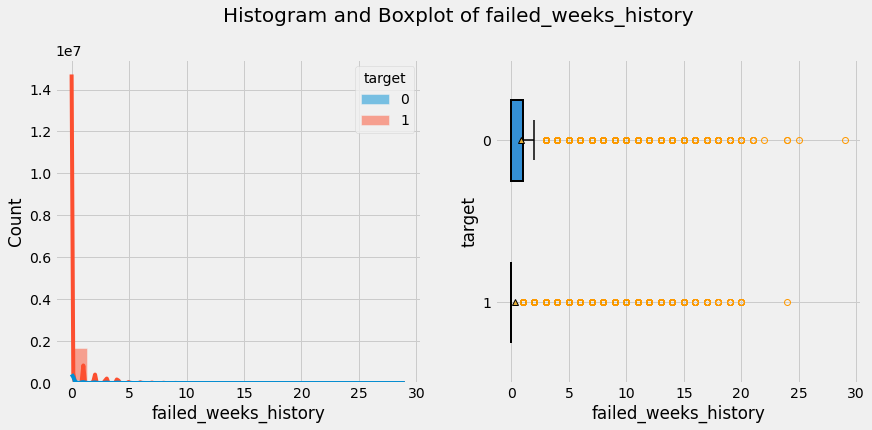

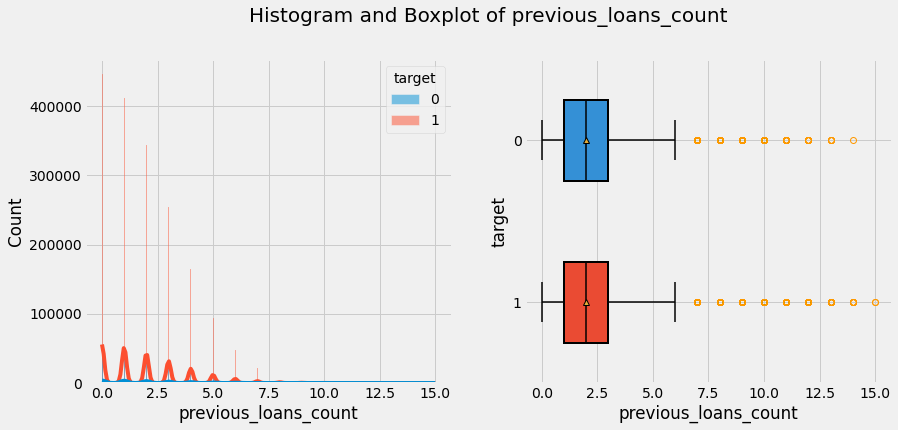

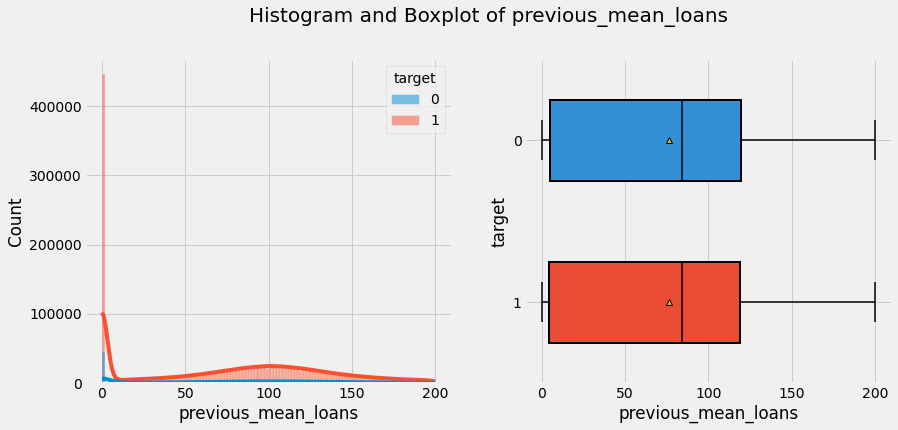

----------------------------------------------------------------------------------------------------
Countplot(s):



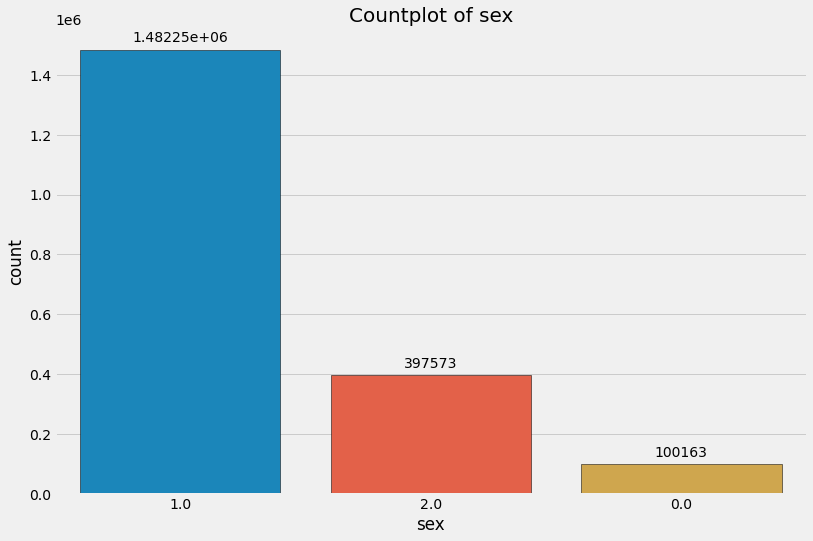

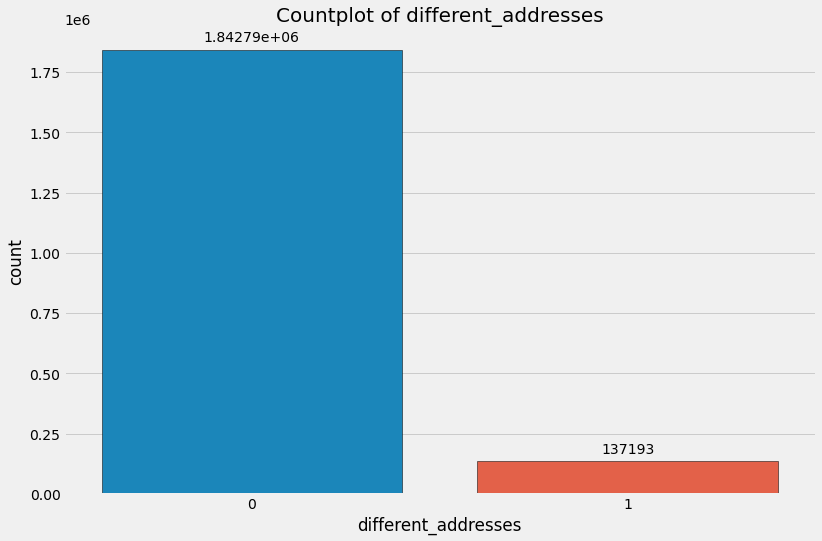

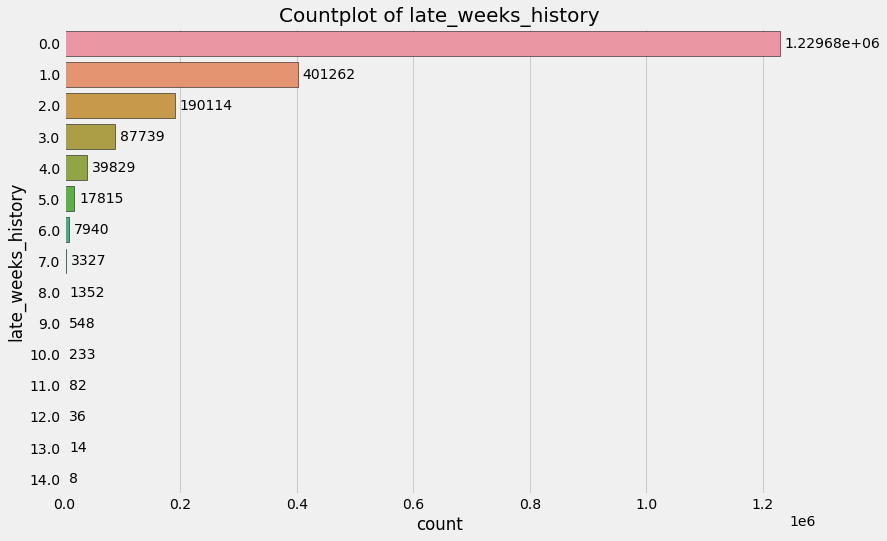

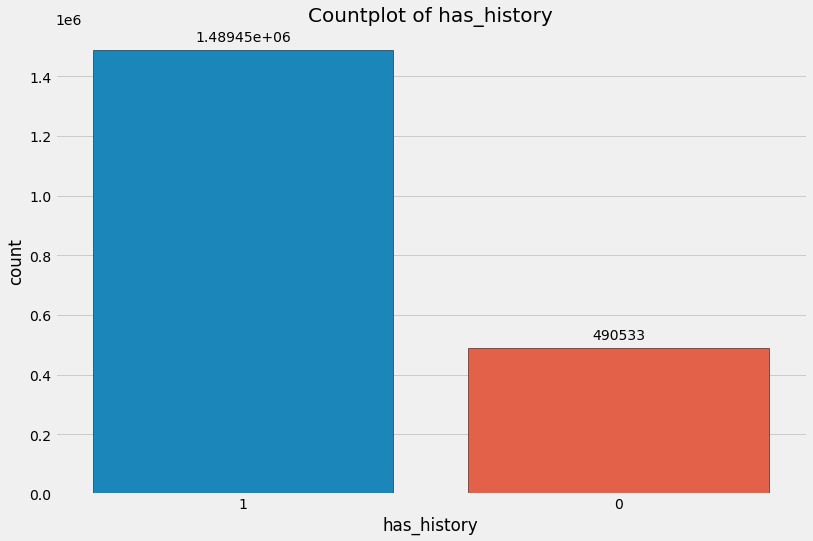

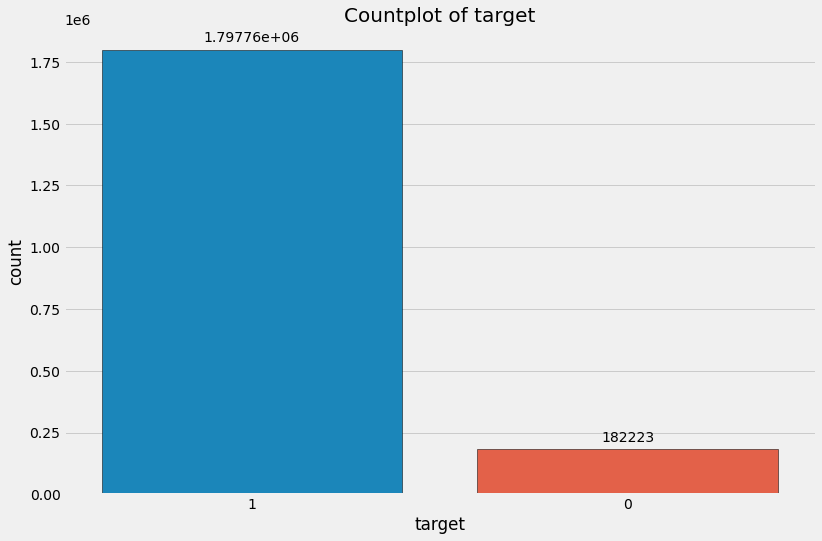

In [ ]:
## EDA for variables which can be used for modelling
fast_eda(df[possible_modelling_cols], target='target', pairplot=False)

In [ ]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, QuantileTransformer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression

import bctools as bc
from sklearn.metrics import balanced_accuracy_score, confusion_matrix, roc_auc_score
from typing import Tuple

from sklearn.compose import ColumnTransformer, make_column_transformer

import matplotlib.pyplot as plt

## Baseline

In [ ]:
def print_section(text: str):
  final_text = "| "+text + " |"
  print('\n')
  print('*' * len(final_text))
  print(final_text) 
  print('*' * len(final_text))

def build_binary_classifier(clf, transformer, X_train: pd.DataFrame, y_train: pd.Series, X_test: pd.DataFrame, y_test: pd.DataFrame,
                            threshold: float = None) -> Tuple[float, float]:

    pipeline = make_pipeline(transformer, clf)
    pipeline.fit(X_train, y_train)

    def predict_and_log(X: pd.DataFrame, y: pd.DataFrame, pipeline, threshold: float=None, plot_densities=False, plot_cm_dynamic=False):        
        if threshold:
            y_preds = (pipeline.predict_proba(X)[:, 1] >= threshold).astype(bool)
        else:
            y_preds = pipeline.predict(X)

        cm = confusion_matrix(y.values, y_preds)
        tn, fp, fn, tp = cm.ravel()

        disp = ConfusionMatrixDisplay(cm, display_labels=pipeline.classes_)
        disp.plot()
        plt.show()

        score = balanced_accuracy_score(y.values, y_preds)

        recall = tp/(tp+fn)
        precision = tp/(tp+fp)

        print(f'balanced_accuracy: {score:.3f}, precision: {precision:.3f}, recall: {recall:.3f}')
        print()

        y_preds_proba = pipeline.predict_proba(X)[:,1]
        ROC_plot, area_under_ROC = bc.curve_ROC_plot(true_y=y.values, predicted_proba=y_preds_proba)
        ROC_plot.show()

        if plot_densities:
            threshold_step = 0.05
            curve_type = 'kde'
            density_curve_kde = bc.predicted_proba_density_curve_plot(true_y = y, 
                                                                    predicted_proba = y_preds_proba, 
                                                                    threshold_step = threshold_step,
                                                                    curve_type = curve_type)
            density_curve_kde.show()

        if plot_cm_dynamic:
            cf_fig, var_metrics_df, invar_metrics_df, opt_thresh_df = bc.confusion_matrix_plot(
                true_y = y, 
                predicted_proba = y_preds_proba, 
                threshold_step = threshold_step, 
                title = 'Interactive Confusion Matrix for the Training Set')
            cf_fig.show()
        print()

    print_section('TRAIN_SCORE')
    predict_and_log(X_train, y_train, pipeline, threshold)

    print_section('TEST_SCORE')
    predict_and_log(X_test, y_test, pipeline, threshold, plot_densities=True, plot_cm_dynamic=True)


    return pipeline

In [ ]:
# Drop: age, row_number, price, previous_mean_loans, previous_loans_count 
# Simple baseline logistic regression model with somehow correlated variables to target 

# For logistic regression we should drop, or transform variables records which are outliers for better generalization
# For simplicity we will use PowerTransformer which will reduce influence of possible outlier values 

# There is no very high correlation between vairables so we dont have to deal with them L1, L2 and so on
possible_modelling_cols = [
       'sex', 'different_addresses', 'paid_weeks_history',
       'late_weeks_history', 'failed_weeks_history',
       'has_history', 'target']

train, test = df[df['row_number'] != 1][possible_modelling_cols], df[df['row_number'] == 1][possible_modelling_cols]

X_train = train.drop(columns='target')
y_train = train['target']

X_test = test.drop(columns='target')
y_test = test['target']



***************
| TRAIN_SCORE |
***************


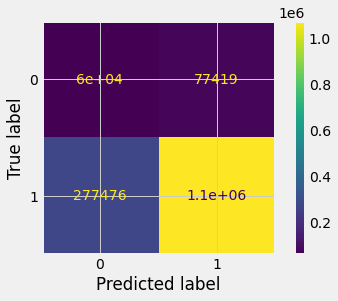

balanced_accuracy: 0.615, precision: 0.933, recall: 0.795






**************
| TEST_SCORE |
**************


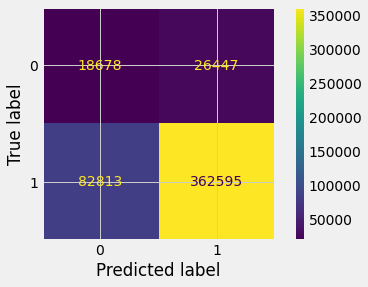

balanced_accuracy: 0.614, precision: 0.932, recall: 0.814



In [ ]:
clf = LogisticRegression(class_weight='balanced')
out_pipeline = build_binary_classifier(clf, None, X_train, y_train, X_test, y_test)

## The results are not the best but we cannot do much with such small amount of valuable variables
## We can add on dynamic graph information about cost of each individual case to get the best threshold for possible income

## Also we can try to do SMOTE 



***************
| TRAIN_SCORE |
***************


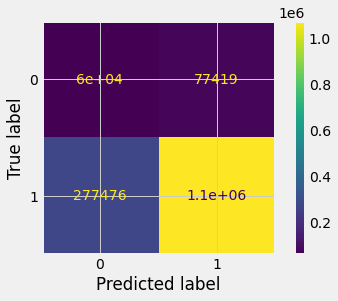

balanced_accuracy: 0.615, precision: 0.933, recall: 0.795






**************
| TEST_SCORE |
**************


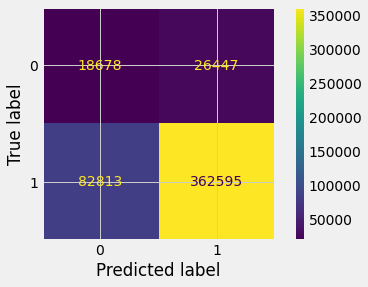

balanced_accuracy: 0.614, precision: 0.932, recall: 0.814



In [ ]:
# It turns out that we can achieve better results without any data transformation
# Same score with MinMaxScaler + StandardScaler

cols_for_transformations = ['paid_weeks_history', 'late_weeks_history', 'failed_weeks_history']

# transformation = make_column_transformer(
#     (PowerTransformer(), cols_for_transformations),
#     remainder='passthrough'
# )

transformation = make_column_transformer(
    (MinMaxScaler(), cols_for_transformations),
    (StandardScaler(), cols_for_transformations),
    remainder='passthrough'
)

clf = LogisticRegression(class_weight='balanced')
out_pipeline = build_binary_classifier(clf, transformation, X_train, y_train, X_test, y_test)

## Boosting

In [ ]:
import catboost
from catboost import (
    CatBoostClassifier, 
    Pool,
)

In [ ]:
def print_section(text: str):
  final_text = "| "+text + " |"
  print('\n')
  print('*' * len(final_text))
  print(final_text) 
  print('*' * len(final_text))

def build_binary_catboost(model, X_train: pd.DataFrame, y_train: pd.Series, X_test: pd.DataFrame, y_test: pd.Series,
                            threshold: float = None) -> Tuple[float, float]:

    train_pool = Pool(data=X_train, label=y_train)
    test_pool = Pool(data=X_test, label=y_test)

    model.fit(train_pool, eval_set=test_pool, use_best_model=True)

    def predict_and_log(X: pd.DataFrame, y: pd.DataFrame, model, threshold: float=None, plot_densities=False, plot_cm_dynamic=False):        
        if threshold:
            y_preds = (model.predict_proba(X)[:, 1] >= threshold).astype(bool)
        else:
            y_preds = model.predict(X)

        cm = confusion_matrix(y.values, y_preds)
        tn, fp, fn, tp = cm.ravel()

        disp = ConfusionMatrixDisplay(cm, display_labels=model.classes_)
        disp.plot()
        plt.show()

        score = balanced_accuracy_score(y.values, y_preds)

        recall = tp/(tp+fn)
        precision = tp/(tp+fp)

        print(f'balanced_accuracy: {score:.3f}, precision: {precision:.3f}, recall: {recall:.3f}')
        print()

        y_preds_proba = model.predict_proba(X)[:,1]
        ROC_plot, area_under_ROC = bc.curve_ROC_plot(true_y=y.values, predicted_proba=y_preds_proba)
        ROC_plot.show()

        if plot_densities:
            threshold_step = 0.05
            curve_type = 'kde'
            density_curve_kde = bc.predicted_proba_density_curve_plot(true_y = y, 
                                                                    predicted_proba = y_preds_proba, 
                                                                    threshold_step = threshold_step,
                                                                    curve_type = curve_type)
            density_curve_kde.show()

        if plot_cm_dynamic:
            cf_fig, var_metrics_df, invar_metrics_df, opt_thresh_df = bc.confusion_matrix_plot(
                true_y = y, 
                predicted_proba = y_preds_proba, 
                threshold_step = threshold_step, 
                title = 'Interactive Confusion Matrix for the Training Set')
            cf_fig.show()
        print()

    print_section('TRAIN_SCORE')
    predict_and_log(X_train, y_train, model, threshold)

    print_section('TEST_SCORE')
    predict_and_log(X_test, y_test, model, threshold, plot_densities=True, plot_cm_dynamic=True)


    return model

Learning rate set to 0.5
0:	learn: 0.6557831	test: 0.6540968	best: 0.6540968 (0)	total: 355ms	remaining: 17.4s
1:	learn: 0.6447573	test: 0.6423446	best: 0.6423446 (1)	total: 579ms	remaining: 13.9s
2:	learn: 0.6417677	test: 0.6386880	best: 0.6386880 (2)	total: 737ms	remaining: 11.5s
3:	learn: 0.6407361	test: 0.6375275	best: 0.6375275 (3)	total: 912ms	remaining: 10.5s
4:	learn: 0.6395071	test: 0.6363557	best: 0.6363557 (4)	total: 1.1s	remaining: 9.94s
5:	learn: 0.6390941	test: 0.6358552	best: 0.6358552 (5)	total: 1.31s	remaining: 9.58s
6:	learn: 0.6391446	test: 0.6356050	best: 0.6356050 (6)	total: 1.48s	remaining: 9.08s
7:	learn: 0.6387563	test: 0.6354460	best: 0.6354460 (7)	total: 1.68s	remaining: 8.8s
8:	learn: 0.6387051	test: 0.6353856	best: 0.6353856 (8)	total: 1.87s	remaining: 8.52s
9:	learn: 0.6386300	test: 0.6353768	best: 0.6353768 (9)	total: 2.05s	remaining: 8.19s
10:	learn: 0.6387093	test: 0.6353573	best: 0.6353573 (10)	total: 2.2s	remaining: 7.81s
11:	learn: 0.6387893	test: 0.6

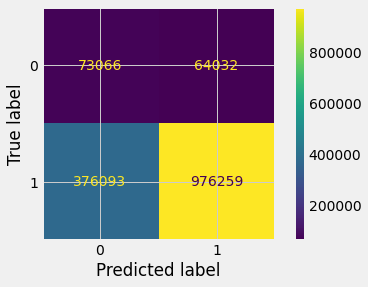

balanced_accuracy: 0.627, precision: 0.938, recall: 0.722






**************
| TEST_SCORE |
**************


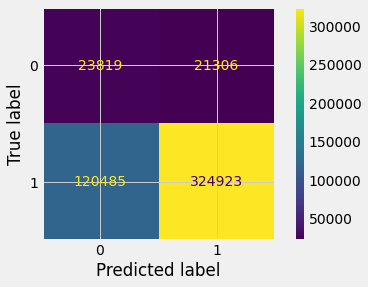

balanced_accuracy: 0.629, precision: 0.938, recall: 0.729



In [ ]:
# Here we got a model with the same number of columns as Logistic regression

params = {
    'iterations': 50,
    'loss_function': 'Logloss',
    'auto_class_weights': 'Balanced',
    'verbose': True,
    'task_type': 'CPU',
    'max_depth': 5
}

model = CatBoostClassifier(**params)
out_pipeline = build_binary_catboost(model, X_train, y_train, X_test, y_test)

# We can try to build model with eval metric f beta score to maximise more precision or recall
# This is hard with this kind of target class imbalance but in real case worth try.

# Balance accuracy is better in Catboost also we can achieve slightly more cohens kappa on 0.3 threshold than from Logistic Regression

# The is so small amount of features so we can should probably change catboost model for xgboost or lightbm for faster training

In [ ]:
# We can check how training goes with another variables since Boosting method is not a linear model.

possible_modelling_cols_catboost = ['price', 'row_number',
       'sex', 'age', 'different_addresses', 'paid_weeks_history',
       'late_weeks_history', 'failed_weeks_history', 'previous_loans_count',
       'has_history', 'previous_mean_loans', 'target']


train, test = df[df['row_number'] != 1][possible_modelling_cols_catboost], df[df['row_number'] == 1][possible_modelling_cols_catboost]

X_train = train.drop(columns='target')
y_train = train['target']

X_test = test.drop(columns='target')
y_test = test['target']

Learning rate set to 0.5
0:	learn: 0.6560776	test: 0.6541972	best: 0.6541972 (0)	total: 473ms	remaining: 23.2s
1:	learn: 0.6457783	test: 0.6424913	best: 0.6424913 (1)	total: 849ms	remaining: 20.4s
2:	learn: 0.6413143	test: 0.6385503	best: 0.6385503 (2)	total: 1.23s	remaining: 19.2s
3:	learn: 0.6402836	test: 0.6369316	best: 0.6369316 (3)	total: 1.57s	remaining: 18.1s
4:	learn: 0.6390765	test: 0.6365196	best: 0.6365196 (4)	total: 1.96s	remaining: 17.6s
5:	learn: 0.6390890	test: 0.6360251	best: 0.6360251 (5)	total: 2.14s	remaining: 15.7s
6:	learn: 0.6388040	test: 0.6357163	best: 0.6357163 (6)	total: 2.37s	remaining: 14.5s
7:	learn: 0.6390867	test: 0.6357079	best: 0.6357079 (7)	total: 2.59s	remaining: 13.6s
8:	learn: 0.6389715	test: 0.6355538	best: 0.6355538 (8)	total: 2.79s	remaining: 12.7s
9:	learn: 0.6388130	test: 0.6355399	best: 0.6355399 (9)	total: 3s	remaining: 12s
10:	learn: 0.6388325	test: 0.6355303	best: 0.6355303 (10)	total: 3.19s	remaining: 11.3s
11:	learn: 0.6388224	test: 0.635

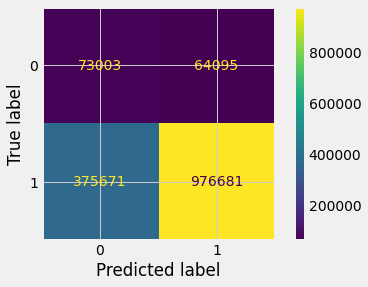

balanced_accuracy: 0.627, precision: 0.938, recall: 0.722






**************
| TEST_SCORE |
**************


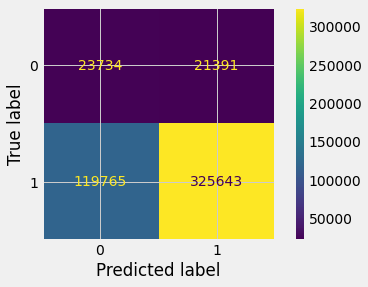

balanced_accuracy: 0.629, precision: 0.938, recall: 0.731



In [ ]:
params = {
    'iterations': 50,
    'loss_function': 'Logloss',
    'auto_class_weights': 'Balanced',
    'verbose': True,
    'task_type': 'CPU',
    'max_depth': 5
}

model = CatBoostClassifier(**params)
out_pipeline = build_binary_catboost(model, X_train, y_train, X_test, y_test)

# Summary


## Task 4

I Feel like this is a strange question taking into consideration data which is artificially generated. 
If I had the real dataset I could check for any patterns which occurs in different groups of people. This kind of patterns can be found with unsupervised algorithms like: k-means or dbscan. 
Maybe we can find people who are making shopping only in one type of store and personalize products specially for them (with some discounts or something like that). We can try to find perfect customer profile and then send marketting messages to simillar people from database. 

## Task 6

Created models are not the best. In this case any hyperparameter tuning won't give us much better results. What we need is more data about each particular client. We can predict just a little bit better than random guess. We could explore more location data. Maybe it could be more usefull. 